# **TP Wavelets**

In this TP, we will work on some fundamental concepts in Wavelets and compression of images.

First we'll briefly check the limitations of the Fourier transform. We'll then check some fundamental properties of a family of Wavelets and compute the Wavelet transform of a very simple signal. In the second part of the TP, we will use the DWT to compress and image.

# Setup
First, we install PyWavelets

In [4]:
!pip install PyWavelets

In [5]:
import pywt
pywt.__version__

import numpy as np
import numpy.fft as DFT
import matplotlib.pyplot as plt
import scipy


# Limitation of the Fourier Transform
*   Create a sinusoidal signal of 2.5 seconds of duration.
*   Set up a sampling rate of 20kHz. The signal should be divided in 5 parts of 0.5 seconds of duration each.
*  The signal should have the following frequencies in this order {10 Hz, 30 Hz, 60 Hz, 30 Hz, 10 Hz}.

In [6]:
signal_length = 2.5 # Duration in second
fs = 20000 # Sampling rate in Hz

# 2.5 * 20000 = 50000 points in total to represent our signal, 10000 for each part of 0.5 s
f1 = 10 # Each frequency in Hertz
f2 = 30
f3 = 60

signal1 = np.sin(2*np.pi*f1*np.arange(10000)/fs)
signal2 = np.sin(2*np.pi*f2*np.arange(10000)/fs)
signal3 = np.sin(2*np.pi*f3*np.arange(10000)/fs)

time=np.arange(0,signal_length,1/fs)
signal = np.concatenate([signal1,signal2,signal3,signal2,signal1])

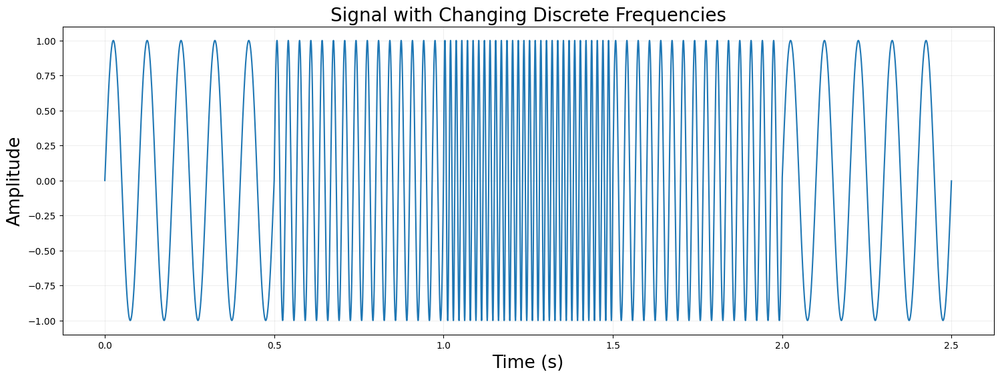

In [7]:
import matplotlib
import matplotlib.pyplot as plt

font_size = 20

plt.figure(figsize=(18, 6))

plt.plot(time, signal, linewidth=1.5)
plt.title('Signal with Changing Discrete Frequencies', fontsize=font_size)
plt.xlabel('Time (s)', fontsize=font_size-1)
plt.ylabel('Amplitude', fontsize=font_size-1)
plt.grid(alpha=0.2)

Now, you should compute the Discrete Fourier Transform of the signal. You can use any library from Python you prefer. You might need to cut the x-axis in the Fourier transform up to 100 Hz in the visualization. Please check https://numpy.org/doc/stable/reference/generated/numpy.fft.fft.html and https://numpy.org/doc/stable/reference/generated/numpy.fft.fftfreq.html

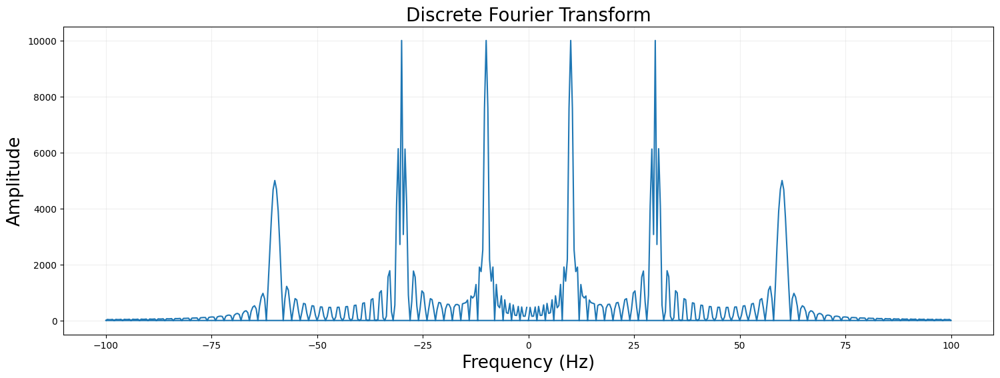

In [8]:
dft_signal = abs(DFT.fft(signal))
frequencies = np.fft.fftfreq(len(dft_signal),1/fs)
frequency_limit = 100

mask = (frequencies <= frequency_limit) & (frequencies >= - frequency_limit)

plt.figure(figsize=(18, 6))
plt.plot(frequencies[mask], dft_signal[mask], linewidth=1.5)
plt.title('Discrete Fourier Transform', fontsize=font_size)
plt.xlabel('Frequency (Hz)', fontsize=font_size-1)
plt.ylabel('Amplitude', fontsize=font_size-1)
plt.grid(alpha=0.2)

# If we decide to keep only the positive frequencies :

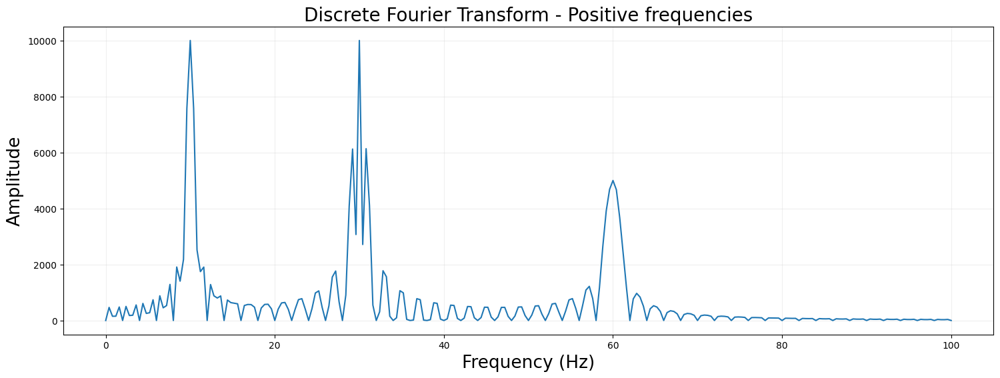

In [9]:
mask = (frequencies <= frequency_limit) & (frequencies >= 0)

plt.figure(figsize=(18, 6))
plt.plot(frequencies[mask], dft_signal[mask], linewidth=1.5)
plt.title('Discrete Fourier Transform - Positive frequencies', fontsize=font_size)
plt.xlabel('Frequency (Hz)', fontsize=font_size-1)
plt.ylabel('Amplitude', fontsize=font_size-1)
plt.grid(alpha=0.2)

**QUESTIONS**

1) Does the established sampling rate satisfy the Nyquist-Shannon sampling theorem to avoid aliasing? Please justify.

2) What can you say from the signal looking **only** at the Fourier transform?

3) Can you be certain about the location of some frequency component in the time domain? Why?

1) We know that the sampling frequency used is fs = 20 000 Hz. Our signal has fequencies ranged from 10 Hz to 60 Hz.
The Nyquist-Shannon sampling theorem is satisfied if : 
$$f_s \geq 2f_{max}$$
Since $f_{max} = 60 Hz$, the theorem is verified, and the established sampling rate avoid aliasing.

2) Looking only at the Fourier transform, we can say that the main frequency components are 10 Hz, 30 Hz and 60 Hz.

3) To answer this question, we created a similar signal using signal1, signal2 and signal3, and then we plotted the two graphs. We see that they are slightly different on the 30 Hz component, but we can't say for sure which one is which just by looking at them.

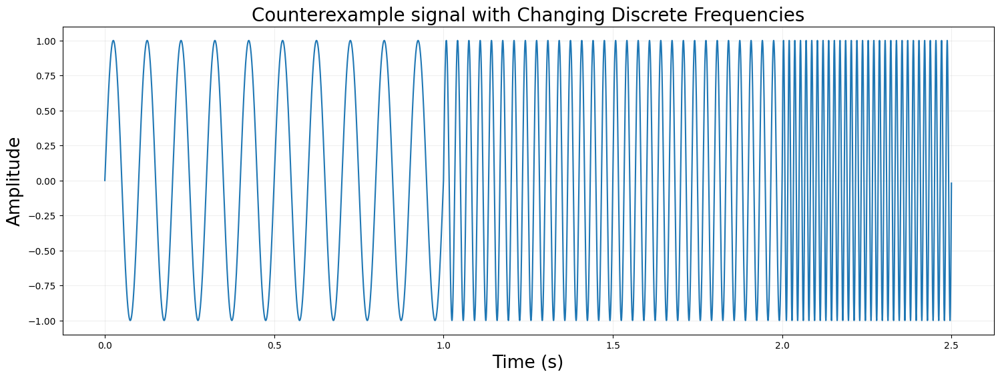

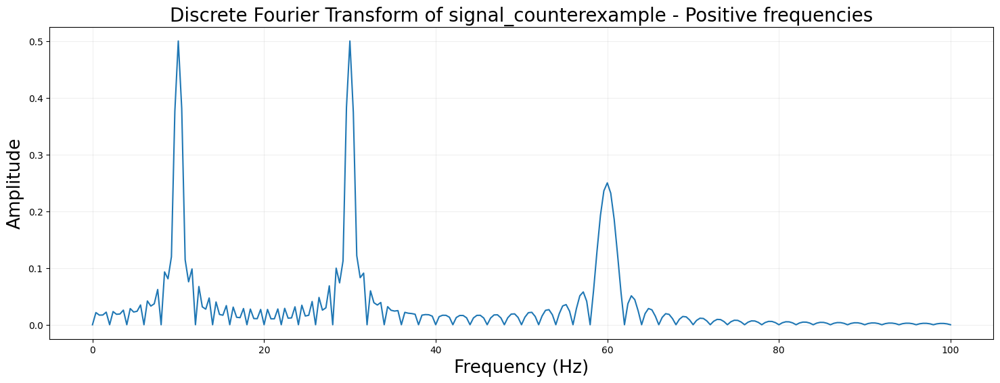

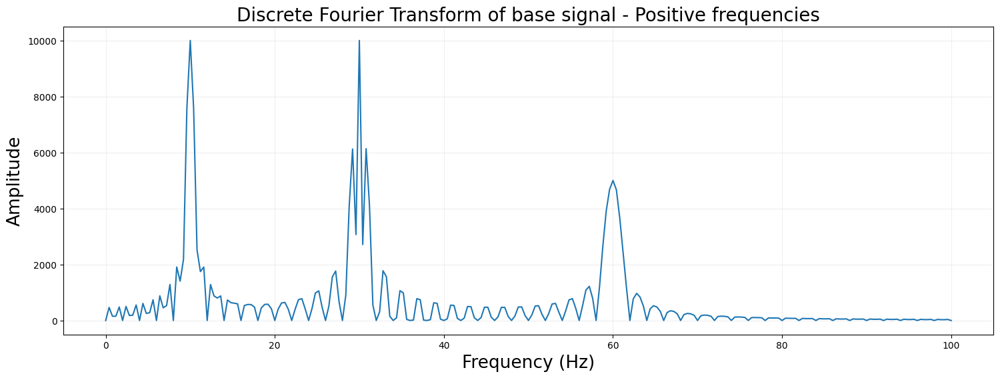

In [10]:
signal_counterexample = np.concatenate([signal1,signal1,signal2,signal2,signal3])
plt.figure(figsize=(18, 6))
plt.plot(time, signal_counterexample, linewidth=1.5)
plt.title('Counterexample signal with Changing Discrete Frequencies', fontsize=font_size)
plt.xlabel('Time (s)', fontsize=font_size-1)
plt.ylabel('Amplitude', fontsize=font_size-1)
plt.grid(alpha=0.2)
dft_signal_counterexample = abs(DFT.fft(signal_counterexample))/fs
frequencies = np.fft.fftfreq(len(dft_signal_counterexample),1/fs)
frequency_limit = 100
mask = (frequencies <= frequency_limit) & (frequencies >= 0)
plt.figure(figsize=(18, 6))
plt.plot(frequencies[mask], dft_signal_counterexample[mask], linewidth=1.5)
plt.title('Discrete Fourier Transform of signal_counterexample - Positive frequencies', fontsize=font_size)
plt.xlabel('Frequency (Hz)', fontsize=font_size-1)
plt.ylabel('Amplitude', fontsize=font_size-1)
plt.grid(alpha=0.2)
plt.figure(figsize=(18, 6))
plt.plot(frequencies[mask], dft_signal[mask], linewidth=1.5)
plt.title('Discrete Fourier Transform of base signal - Positive frequencies', fontsize=font_size)
plt.xlabel('Frequency (Hz)', fontsize=font_size-1)
plt.ylabel('Amplitude', fontsize=font_size-1)
plt.grid(alpha=0.2)

# **Mother Wavelet**
As we saw in the course, a wavelet is not just a function but a whole family of functions that satisfy certain requirements. In this part of the TP we're gonna work with the Morlet wavelet defined as follows: $\Psi(t)=k e^{iw_0t}e^{-\frac{1}{2}(\frac{t}{\sigma})^2}$. Please generate a Morlet wavelet in Python **WITHOUT using PyWavelets** with the following parameters:

-Center frequency of the wavelet = 10 Hz

-Sampling rate $\eta$ = 20000 Hz

-$k=\frac{1}{\sqrt{\eta}}$

-$\sigma = 0.1$

You can generate the wavelet between -1 and 1 seconds, so the time duration of the wavelet is 2 seconds. For this part, you just need to generate the real part of the wavelet.

# Answer : ##

The Morlet wavelet is defined as follows $\Psi(t)=k e^{iw_0t-\frac{1}{2}(\frac{t}{\sigma})^2}$ 

We will use as notation :

$f_s$ = Sampling rate = $\eta$ = 20000 Hz

Text(0, 0.5, 'Amplitude')

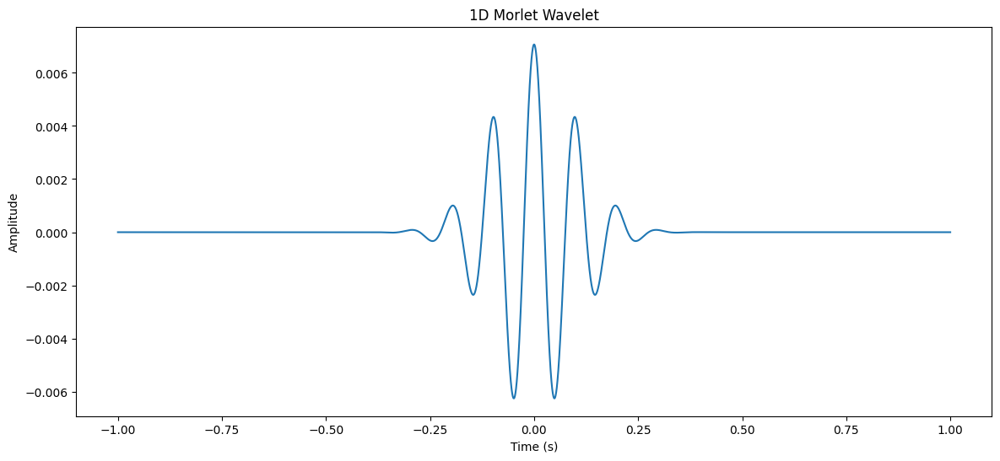

In [11]:
fs = 20000
fc = 10 # Centered frequency
w0 = 2*np.pi*fc
k = 1/np.sqrt(fs)
sigma = 0.1

time = np.arange(-1,1,1/fs)
morlet_wavelet = np.real(k*np.exp(1j*w0*time-(1/2)*(time/sigma)**2))

plt.figure(figsize=(14, 6))
plt.plot(time, morlet_wavelet, linewidth=1.5)
plt.title('1D Morlet Wavelet')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

Please show that the mother wavelet we just created satisfies the admissibility and the finite energy conditions:

___
## Answer : ##

Expression of mother wavelet : $$\Psi(t)=k e^{iw_0t-\frac{1}{2}(\frac{t}{\sigma})^2}$$

Admissibility condition : $$\int_{-\infty}^{+\infty} \psi(t) \, dt = 0$$

Finite energy condition : $$\int_{-\infty}^{+\infty} |\psi(t)|² \, dt < +\infty$$ 

The file **Morlet_wavelet_condition.pdf** contains the computation of those conditions. 
This mother wavelet satisfies the admissibility and finite energy conditions.

___

**Note:** In real life, you have to deal with finite-precision related problems. Therefore, if for the admissibility condition you don't have exactly the value you were expecting for, don't worry.

# **Convolution**

As we saw in the course, we need a measure of similarity to compute the wavelet transform. We also saw that we can easily compute the shift in time and similarity calculation with the 1-D convolutions.

* Generate a chirp sinusoidal signal from -5 to 5 seconds with an initial frequency of 5 Hz and final frequency of 15 Hz and sampling rate of 20kHz:

Text(0.5, 0, 'Time')

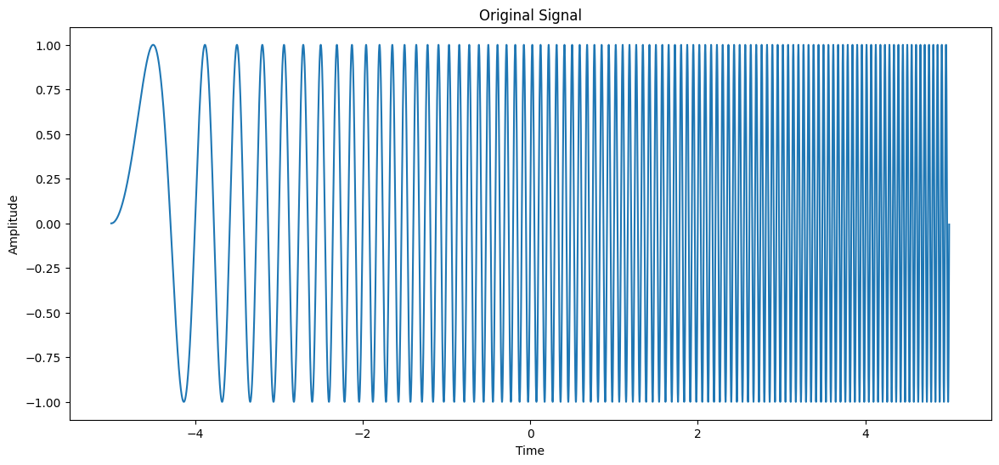

In [12]:
fs = 20000
time_signal = np.arange(-5,5,1/fs)
frequencies = np.arange(5,15,1/fs)

signal = np.sin(2*np.pi*frequencies*time_signal)

plt.figure(figsize=(14, 6))
plt.plot(time_signal, signal)
plt.title('Original Signal')
plt.ylabel('Amplitude')
plt.xlabel('Time')

Now create a Morlet wavelet with the following parameters:

* Center frequency of the wavelet = 10 Hz

* Sampling rate $f_s$ = $\eta$ = 20000 Hz

* $k=\frac{1}{\sqrt{\eta}}$
* $\sigma = 0.2$
* Duration = 2 seconds


Text(0.5, 0, 'Time')

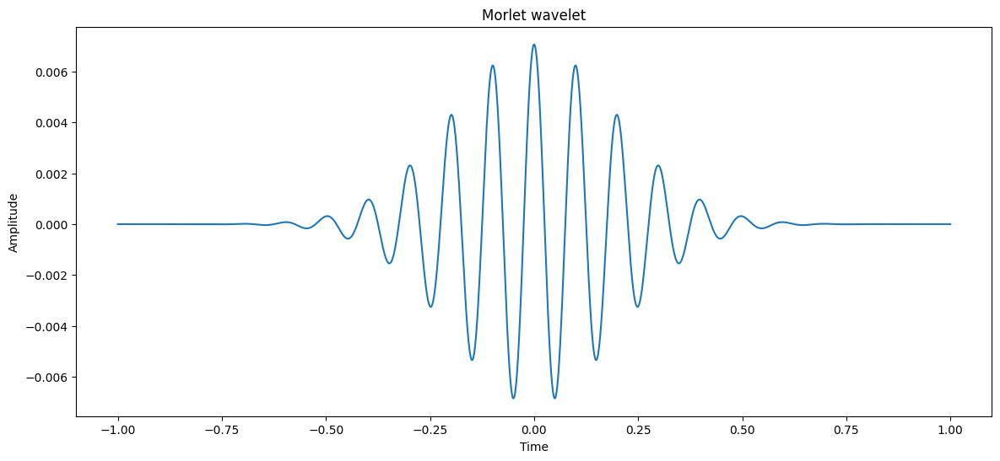

In [13]:
fs = 20000
fc = 10
w0 = 2*np.pi*fc
k = 1/np.sqrt(fs)
sigma = 0.2

time = np.arange(-1,1,1/fs)
morlet_wavelet = k*np.exp(1j*w0*time-(1/2)*(time/sigma)**2)

plt.figure(figsize=(14, 6))
plt.plot(time, np.real(morlet_wavelet))

plt.title('Morlet wavelet')
plt.ylabel('Amplitude')
plt.xlabel('Time')

Compute the convolution between the signal and $Re(\Psi(t))$. For reference on how to perform convolution with scipy 'convolve' function, please check https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.convolve.html

Text(0, 0.5, 'Amplitude')

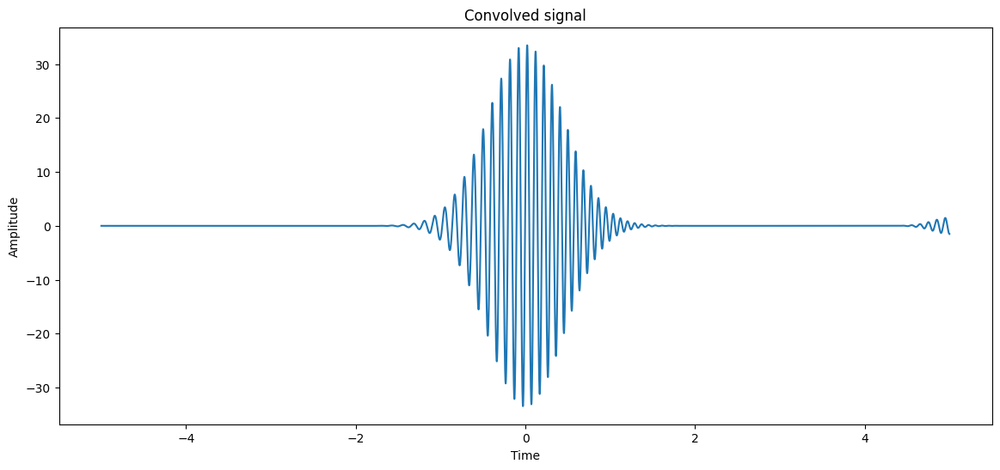

In [14]:
convolved_signal = scipy.signal.convolve(signal,np.real(morlet_wavelet),mode='same')

plt.figure(figsize=(14, 6))
plt.plot(time_signal, convolved_signal)
plt.title('Convolved signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')

There are some points where the convolution is zero, even in regions of high similarity between the wavelet and the signal. **Is this OK?** If it's not, propose a solution to that.

## My answer : ##

We know that the convolution starts to be non-zero when the Morlet wavelet and the chirp sinusoidal signal start to have similarities (may it be being opposite or similar). Nonetheless, even when the wavelet and the signal are in sync, we can observe that there are still zero values in the convolution.

This is due to the fact that we only used the real part of the Morlet wavelet function for the convolution, but it has an imaginary part. We may now use the whole function for the convolution, and then plot its module to get the following plot :


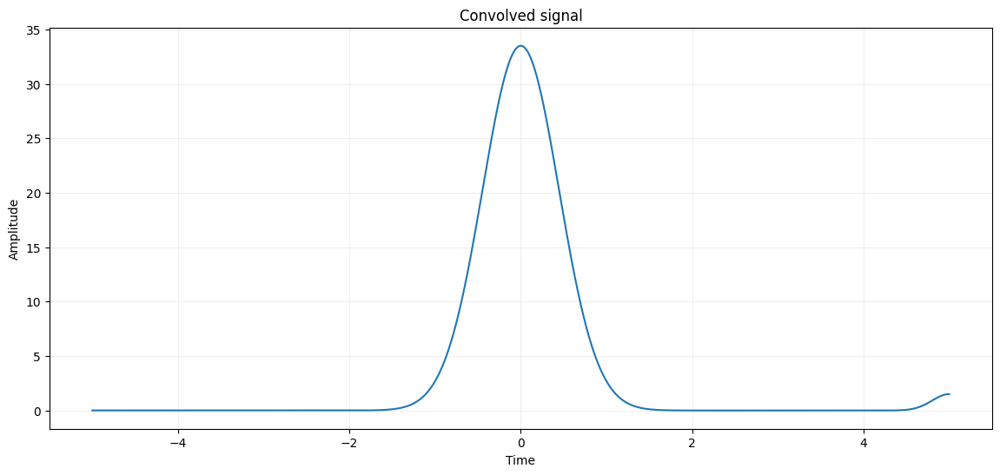

In [15]:
convolved_signal_whole_morlet_wavelet = scipy.signal.convolve(signal,morlet_wavelet,mode='same')

plt.figure(figsize=(14, 6))
plt.plot(time_signal,abs(convolved_signal_whole_morlet_wavelet))
plt.title('Convolved signal')
plt.ylabel('Amplitude')
plt.xlabel('Time')
plt.grid(alpha=0.2)

# **Image Compression**
For this part, we'll use the Discrete Wavelet Transform (DWT) implemented as a filter bank to do image compression. The first step is to have an image to compress. For doing so you can use the following piece of code to download an image of Trudy.

In [16]:
#!wget https://raw.githubusercontent.com/jhonygiraldo/jhonygiraldo.github.io/main/Trudy_for_compression.jpeg
# Image to download and put in current folder

**Visualize image:** With the following code you can visualize the image. If you're using Google Collab, most probably you already have the open cv library installed. If you're using Jupyter Notebook for example, you'll have to install open cv if it's not already installed.

In [35]:
# Let us define a function for visualizing images
def show_image(image,title = 'Input Image',font_size = 12,fig_size = (10,10),text = ""):
  #A function that uses matplotlib to show grayscale images
  plt.figure(figsize=fig_size)
  if text != "":
    plt.figtext(0.5,0.01,text,ha="center",fontsize=12)
  plt.imshow(image, cmap='gray')
  plt.title(title, fontsize=font_size)
  plt.axis('off')

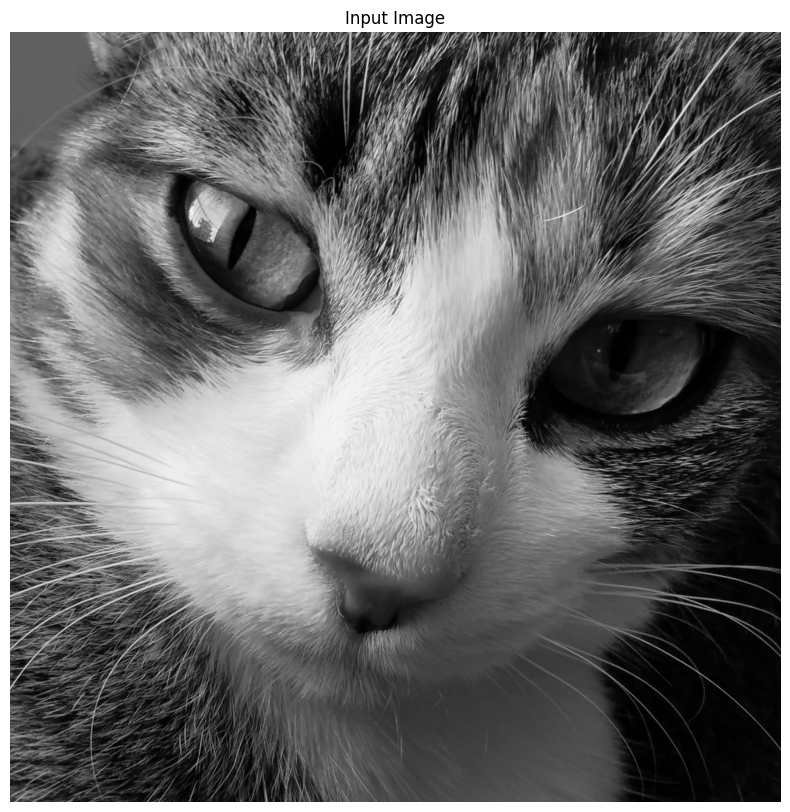

In [18]:
import cv2

# Load your image as a grayscale
input_image = cv2.imread('Trudy_for_compression.jpeg', cv2.IMREAD_GRAYSCALE)
# Display the original image
show_image(input_image, 'Input Image')

If you use some wavelet function (Biorthogonal 1.3 in this case), the 1-level 2D wavelet decomposition of our input image is given as follows:

In [19]:
# # You can see a list of wavelet families
import pywt
pywt.families()

['haar',
 'db',
 'sym',
 'coif',
 'bior',
 'rbio',
 'dmey',
 'gaus',
 'mexh',
 'morl',
 'cgau',
 'shan',
 'fbsp',
 'cmor']

In [20]:
# For each family, you can list the available wavelets
pywt.wavelist(family='db', kind='all')

['db1',
 'db2',
 'db3',
 'db4',
 'db5',
 'db6',
 'db7',
 'db8',
 'db9',
 'db10',
 'db11',
 'db12',
 'db13',
 'db14',
 'db15',
 'db16',
 'db17',
 'db18',
 'db19',
 'db20',
 'db21',
 'db22',
 'db23',
 'db24',
 'db25',
 'db26',
 'db27',
 'db28',
 'db29',
 'db30',
 'db31',
 'db32',
 'db33',
 'db34',
 'db35',
 'db36',
 'db37',
 'db38']

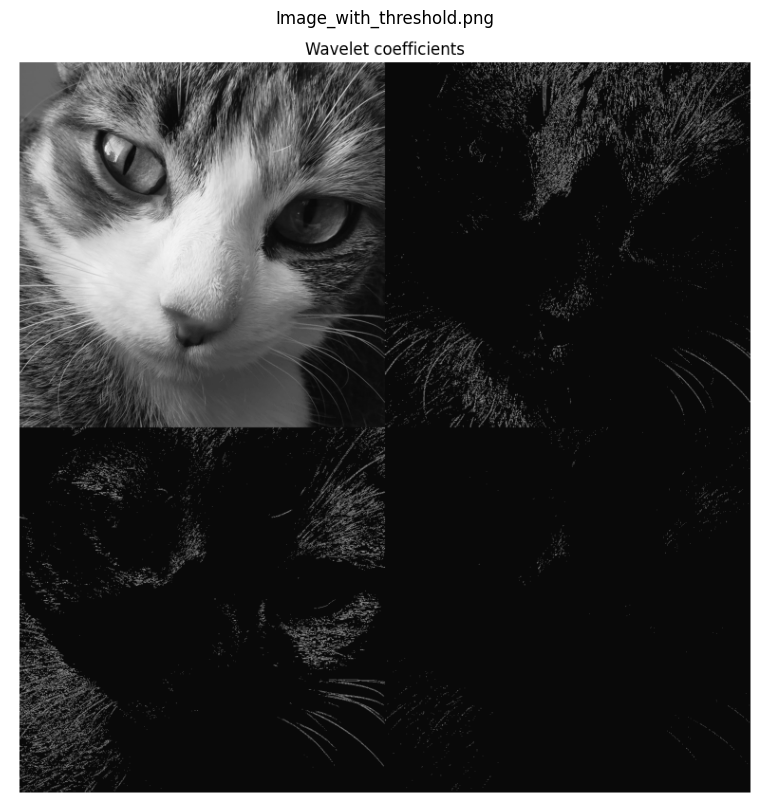

In [21]:
# Image in the folder
image_with_threshold = cv2.imread('Image_with_threshold.png', cv2.IMREAD_GRAYSCALE)
show_image(image_with_threshold, 'Image_with_threshold.png')

In the previous image we applied a threshold in the wavelet coefficients for visualization purposes.

### My answer :

We have here the 1-level decomposition of the image using 2D wavelet. Unlike the decomposition using 1D wavelet, the decomposition using 2D wavelet (here seemingly the biorthogonal 1.3 according to the text), we apply on the base image two filters h and g called quadrature mirror filter :

- A low pass filter g, which gives the approximation coefficients (low frequencies, contain the main structure of the image)
- A high pass hilter h, in all three directions, vertical, horizontal and diagonal (contain the details)

And then we subsample by a factor of 2.

If we want to go to a 2-level decomposition, we repeat the process on the result obtained after the subsampling applied to the output of low pass filter g

Here, at the 1-level decomposition of the image, we can see :

- In the top-left corner, we have the output of low-pass filter g, the low frequencies, containing the main structure of the image
- In the top-right corner, we have the vertical output of filter h, containing the vertical details
- Bottom-left corner, we have the horizontal output of filter h, containing the horizontal details
- Bottom-right corner, we have the diagonal output of filter h, containing the diagonal details

Now, you should compute the six-levels 2D wavelet decomposition of the input image with a Daubechies wavelet with six vanishing moments using the PyWavelet library. Please check https://pywavelets.readthedocs.io/en/latest/ref/2d-dwt-and-idwt.html#d-multilevel-decomposition-using-wavedec2

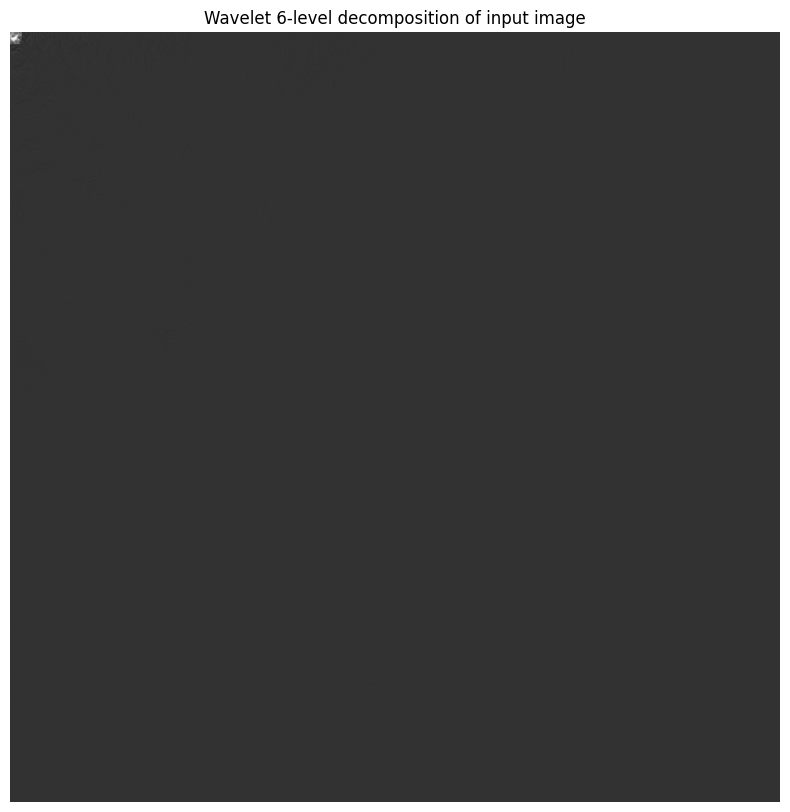

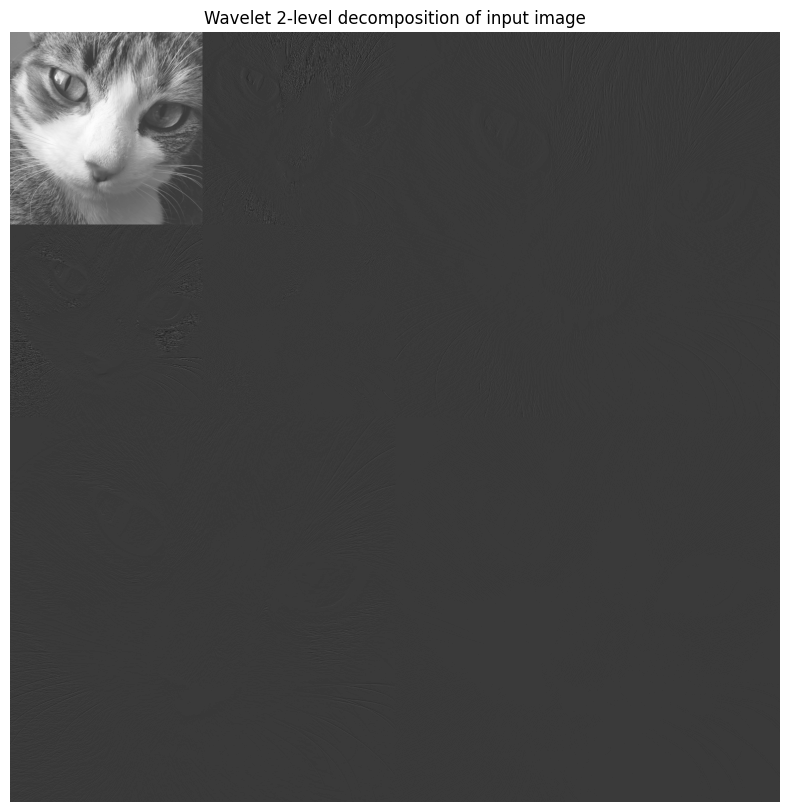

In [22]:
""" 
The website gives us the following information :

pywt.wavedec2(data, wavelet, mode='symmetric', level=None, axes=(-2, -1))
Multilevel 2D Discrete Wavelet Transform
Returns :
[cAn, (cHn, cVn, cDn), … (cH1, cV1, cD1)] list
The first element returned is the approximation coefficients for the nth level of decomposition

cAn is base image structure remaining after the final n-th low pass filter
cHn is the  horizontal details of the n-th high pass filter
cVn is the vertical...
cDn is the diagonal
"""

# We create our own function to concatenate the images to show everything at the same time

def concatenate_images(img1, img2, mode='horizontal'):
  if mode in ['horizontal','h'] :
    height = min(img1.shape[0], img2.shape[0]) # To resize the images properly for the cv2.vconcat
    img1 = cv2.resize(img1, (int(img1.shape[1] * height / img1.shape[0]), height))
    img2 = cv2.resize(img2, (int(img2.shape[1] * height / img2.shape[0]), height))
    concatenated_img = cv2.hconcat([img1, img2])
  elif mode in ['vertical','v']:
    width = min(img1.shape[1], img2.shape[1]) # To resize the images properly for the cv2.vconcat
    img1 = cv2.resize(img1, (width, int(img1.shape[0] * width / img1.shape[1])))
    img2 = cv2.resize(img2, (width, int(img2.shape[0] * width / img2.shape[1])))
    concatenated_img = cv2.vconcat([img1, img2])
  else:
    raise ValueError("Invalid mode. Use 'horizontal' or 'vertical'.")
  return concatenated_img

def reconstruct(wavedec_output):
  level = len(wavedec_output) - 1
  image = wavedec_output[0]
  for i in range(level):
    upper_part = concatenate_images(image,wavedec_output[i+1][1],'h')
    lower_part = concatenate_images(wavedec_output[i+1][0],wavedec_output[i+1][2],'h')
    image = concatenate_images(upper_part,lower_part,'v')
  return(image)

L = pywt.wavedec2(input_image, wavelet = 'db1', level = 6)  

show_image(reconstruct(L),'Wavelet 6-level decomposition of input image')
show_image(reconstruct(pywt.wavedec2(input_image, wavelet = 'db1', level = 2)),'Wavelet 2-level decomposition of input image')

## Answer and explanation ##

Since the threshold is not applied, we have level of gray on the images. With the 2-level decomposition, we can still understand and see what is going, but with the 6-level decomposition it becomes much harder to see.

* Set a threshold of value of 100 and take to zero the values less than that in the 2D wavelet decomposition. **Note:** You should only threshold the outputs of the high-pass filters.



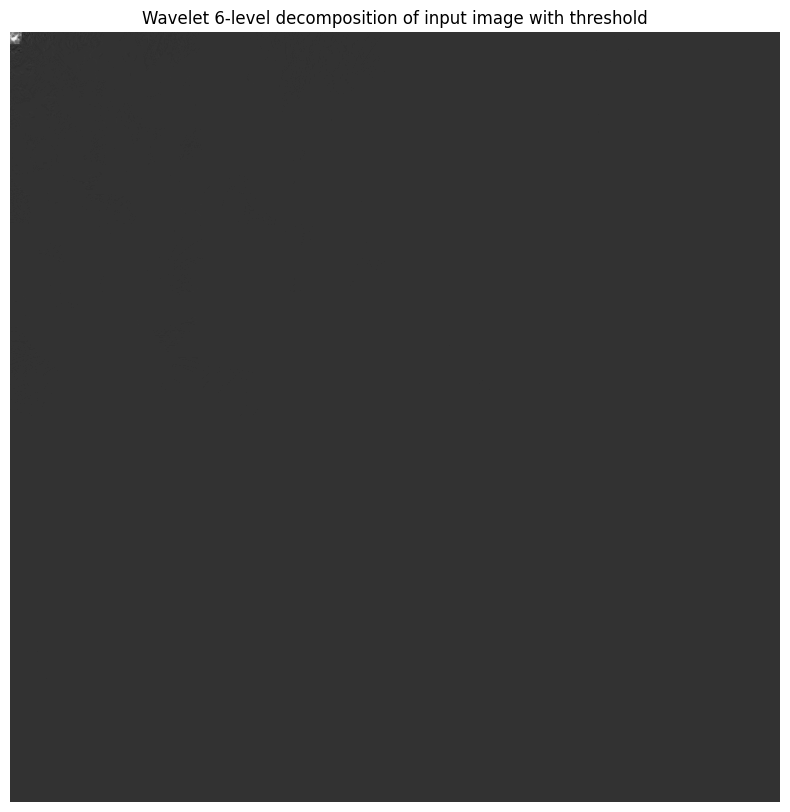

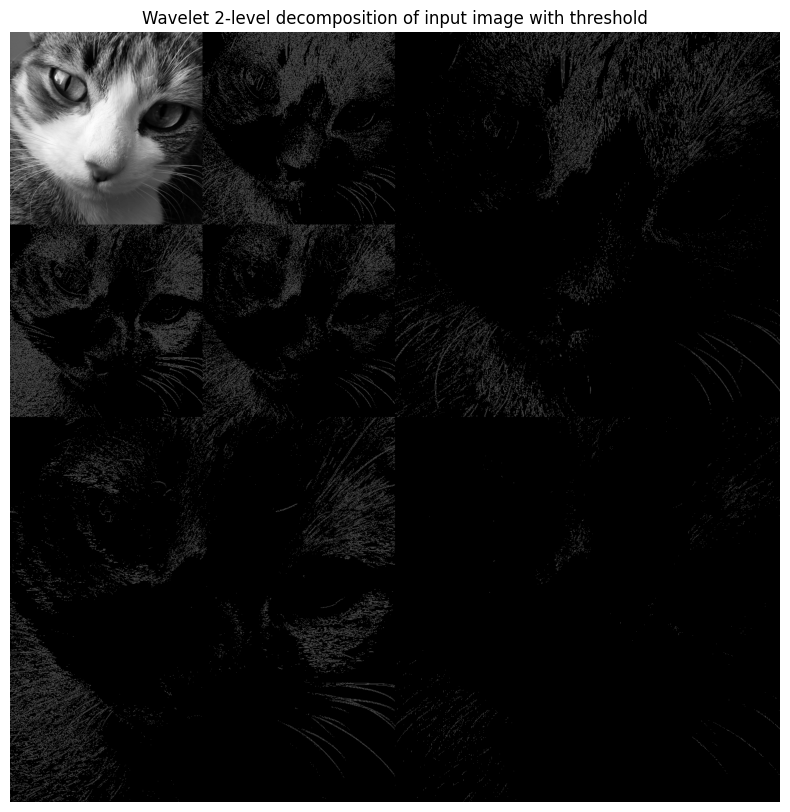

In [23]:
def apply_threshold(wavedec_output,threshold=100,black_white = False):
    level = len(wavedec_output) - 1
    output = [wavedec_output[0]] # No threshold on base image
    for k in range (level):
        L = []
        for l in range (3):
            details = wavedec_output[k+1][l]
            for i in range(details.shape[0]):
                for j in range(details.shape[1]):
                    if abs(details[i,j]) <= threshold:
                        details[i,j] = 0
                    elif black_white:
                        details[i,j] = 255
            L.append(details)
        output.append((L[0],L[1],L[2]))
    return(output)

show_image(reconstruct(apply_threshold(pywt.wavedec2(input_image, wavelet = 'db1', level = 6),100,black_white=False)),'Wavelet 6-level decomposition of input image with threshold')
show_image(reconstruct(apply_threshold(pywt.wavedec2(input_image, wavelet = 'db1', level = 2),20,black_white=True)),'Wavelet 2-level decomposition of input image with threshold')

    

## Answer and explanation ##

On the first image, we simply applied the 100 threshold, and it doesn't seem to change the result. Nonehteless, it sill takes less data to save the image.
On the second image, we reduced the threshold to 20, and we applied the following transformation :

If |coeffs| <= Threshold : coeffs = 0

Else : coeffs = 255

So its either black or white, and it shows the details on each level

* Compute the IDWT to reconstruct the image after the "compression". Check https://pywavelets.readthedocs.io/en/latest/ref/2d-dwt-and-idwt.html#d-multilevel-reconstruction-using-waverec2 as a reference.

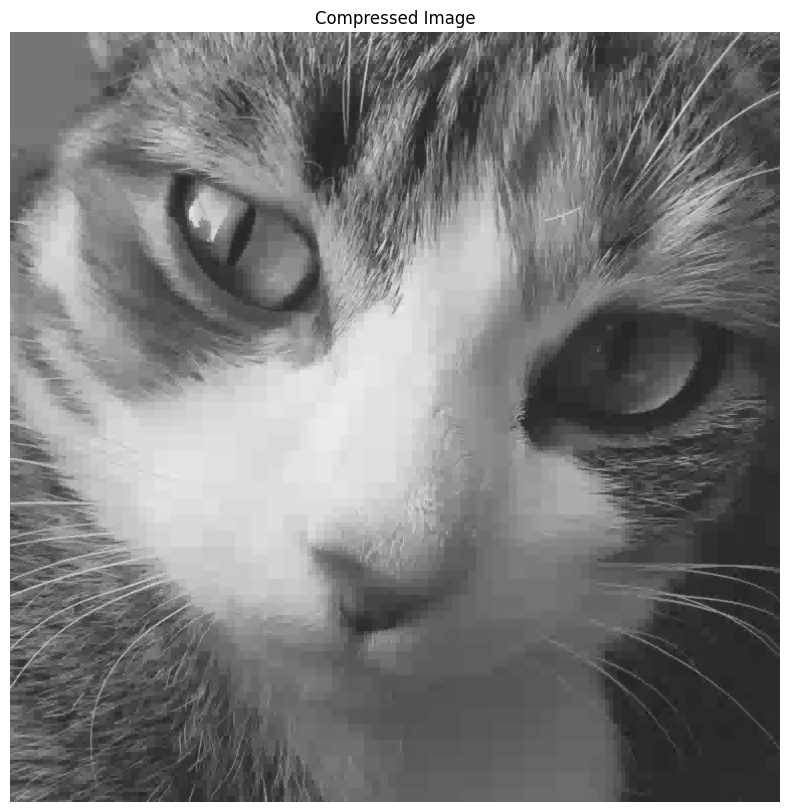

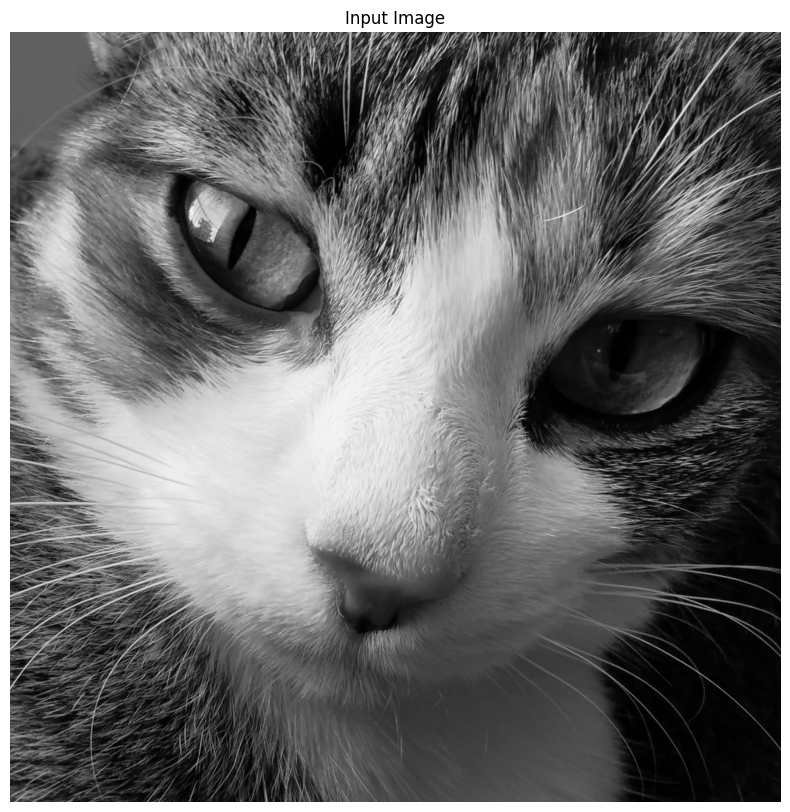

In [24]:
compressed_image = pywt.waverec2(apply_threshold(pywt.wavedec2(input_image, wavelet = 'db1', level = 6),100,black_white=False), wavelet = 'db1')

#plot compressed image
show_image(compressed_image, 'Compressed Image')
show_image(input_image, 'Input Image')

## Answer and explanation ##

We notice that a lot of details are gone from the compression after the threshold was applied.
We can try different values of threshold to see the differences :

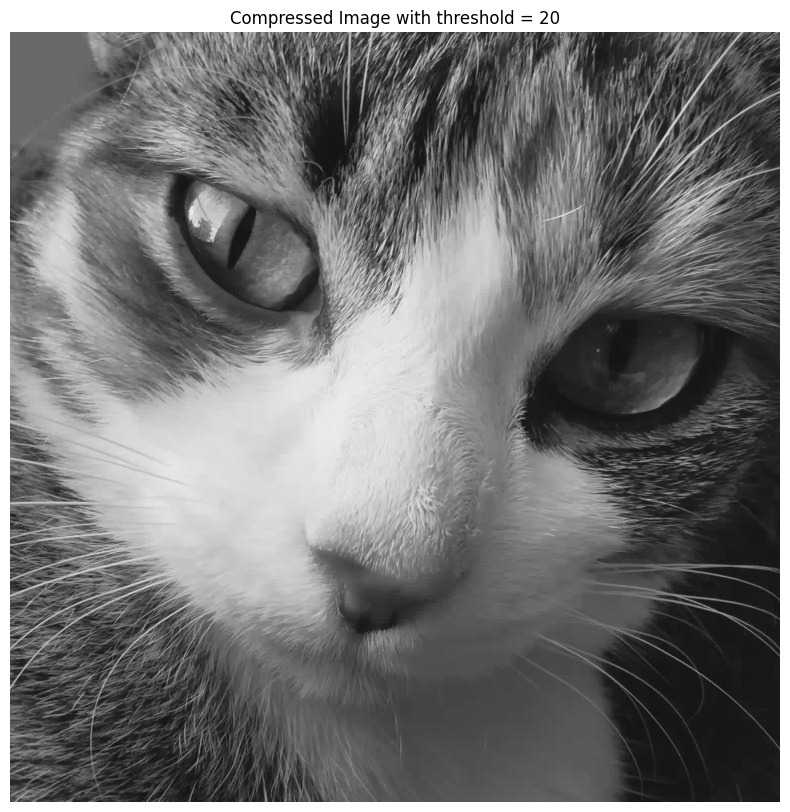

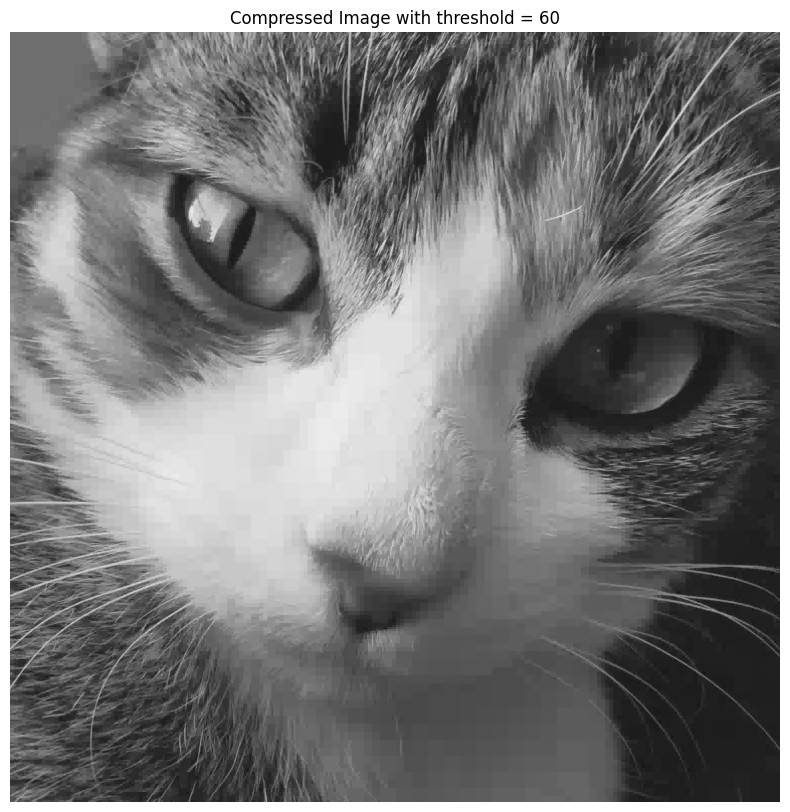

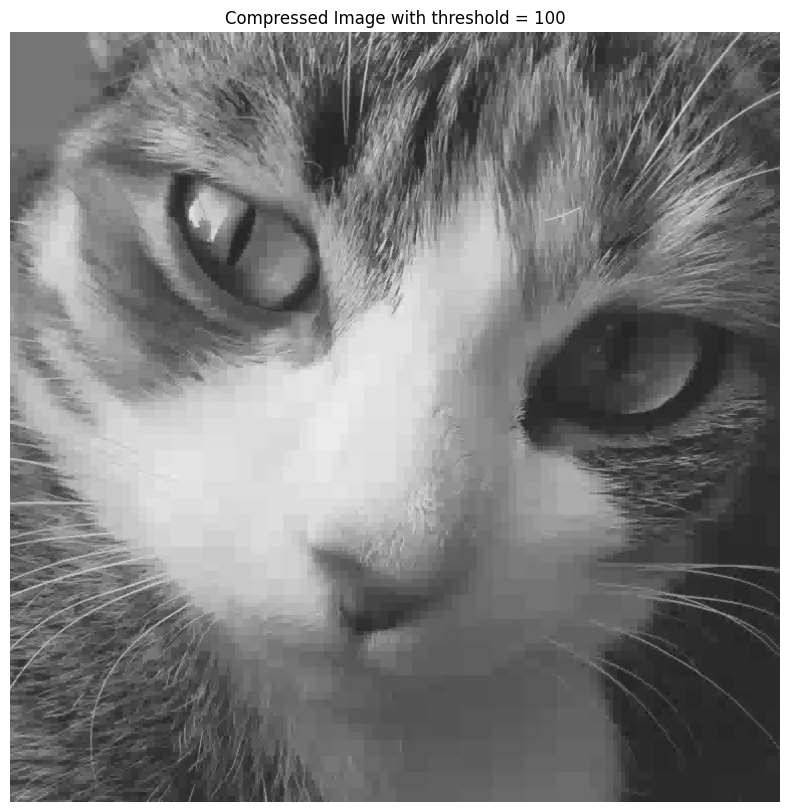

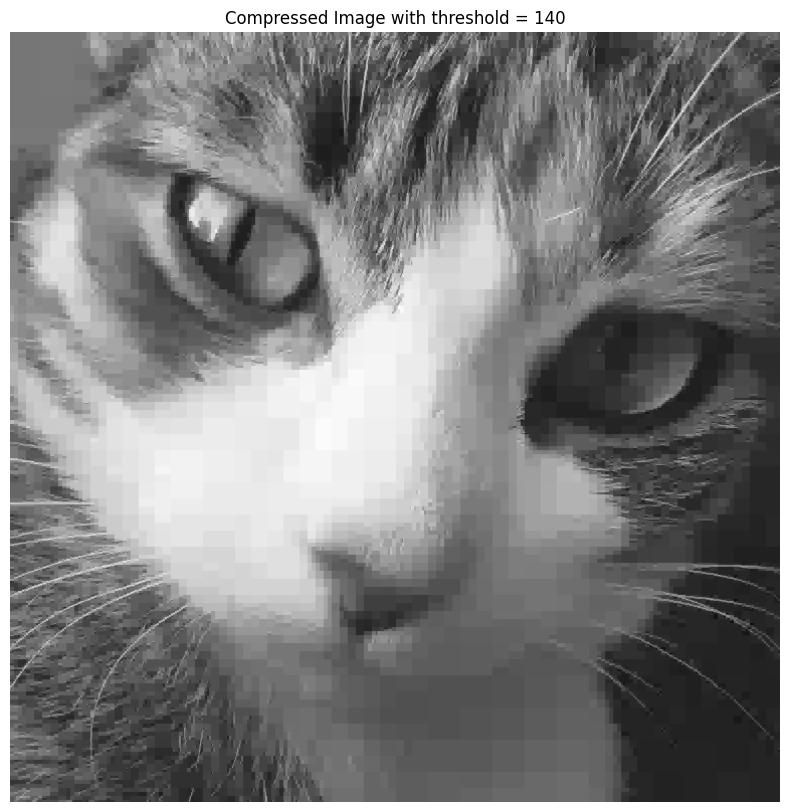

In [25]:
compressed_image_20_threshold = pywt.waverec2(apply_threshold(pywt.wavedec2(input_image, wavelet = 'db1', level = 6),20,black_white=False), wavelet = 'db1')
compressed_image_60_threshold = pywt.waverec2(apply_threshold(pywt.wavedec2(input_image, wavelet = 'db1', level = 6),60,black_white=False), wavelet = 'db1')
compressed_image_140_threshold = pywt.waverec2(apply_threshold(pywt.wavedec2(input_image, wavelet = 'db1', level = 6),140,black_white=False), wavelet = 'db1')

show_image(compressed_image_20_threshold, 'Compressed Image with threshold = 20')
show_image(compressed_image_60_threshold, 'Compressed Image with threshold = 60')
show_image(compressed_image, 'Compressed Image with threshold = 100')
show_image(compressed_image_140_threshold, 'Compressed Image with threshold = 140')


What's the compression ratio?

## Answer and explanation ##

To compute the compression ratio, we need to know the size of both the input and the ouput.
We will use os to know how much bytes are required to store the images

In [26]:
import os

def compression_ratio(input_image, output_image,show_bytes_saved = False):
    cv2.imwrite('input_image.jpeg',input_image)
    cv2.imwrite('compressed_image.jpeg',output_image)
    input_size = os.path.getsize('input_image.jpeg')
    output_size = os.path.getsize('compressed_image.jpeg')
    os.remove('input_image.jpeg')
    os.remove('compressed_image.jpeg')
    if output_size == 0:
        raise ValueError("Output image size is zero. Cannot compute compression ratio.")
    compression_ratio = input_size / output_size
    bytes_saved = input_size - output_size
    if show_bytes_saved :
        return (compression_ratio,bytes_saved)
    return(compression_ratio)

print(compression_ratio(input_image,compressed_image,True))


(2.8795825839017963, 453532)


We see that the compression ratio is approximately 2.88, and that we saved 453532 bytes thanks to this compression.

# **Putting everything together**

In this exercise we'll analyze the Peak Signal to Noise Ration (PSNR) of the compressed images for different thresholds. For doing so, we'll give you the function to compute the PSNR between the original and compressed image.

In [33]:
def psnr(original_image, compressed_image,warning = True):
    h_original,w_original = original_image.shape
    h_compressed,w_compressed = compressed_image.shape
    if (h_original,w_original) != (h_compressed,w_compressed):
        h = min(h_original,h_compressed)
        w = min(w_original,w_compressed)
        original_image = original_image[:h,:w]
        compressed_image = compressed_image[:h,:w]
        if warning :
            print(f"WARNING in function psnr : original image shape {(h_original,w_original)} and compressed image shape {(h_compressed,w_compressed)} are not equal.")
            print(f"Images were resized to shape {(h,w)}")
    mse = np.sum(np.abs(original_image-compressed_image)**2)/(h*w)
    return 20* np.log10(255**2/mse)

Now, you have to create a function codec that receives the input image, the wavelet to be used, the number of levels, and the threshold value. This function returns the compressed image and the compression ratio. **Note:** You already did that previously.

In [28]:
def codec(input_image,wavelet='db4',num_levels=6,threshold=100):
  compressed_image = pywt.waverec2(apply_threshold(pywt.wavedec2(input_image,wavelet = wavelet,level = num_levels),threshold = threshold,black_white=False), wavelet = wavelet)
  comp_ratio = compression_ratio(input_image,compressed_image)
  return (compressed_image,comp_ratio)

Now, we compare the performance of the 'db4' and the 'bior1.3' wavelets in terms of compression ratio and PSNR for different thresholds.

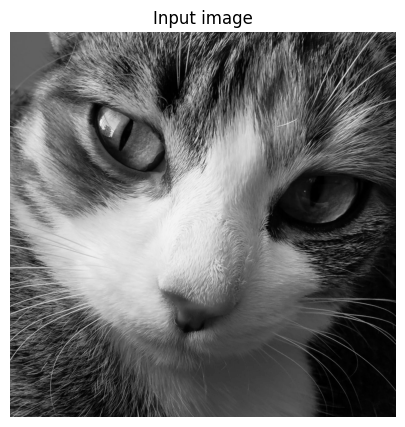

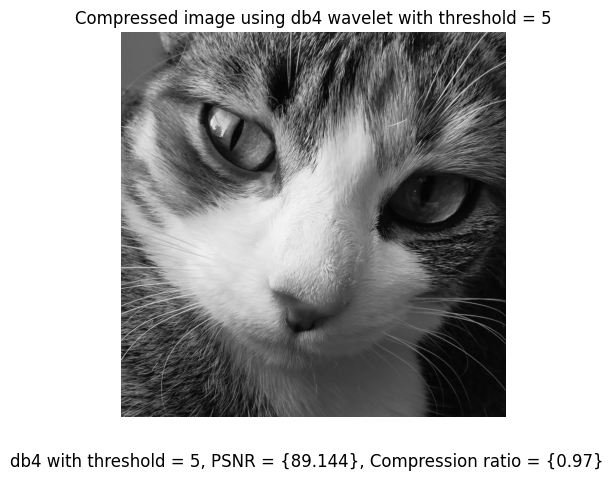

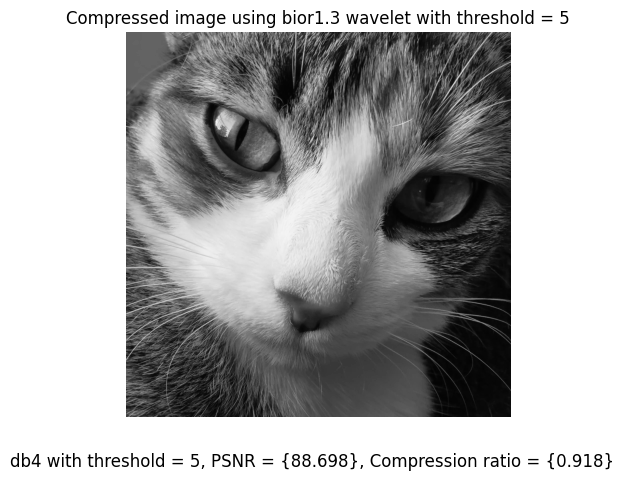

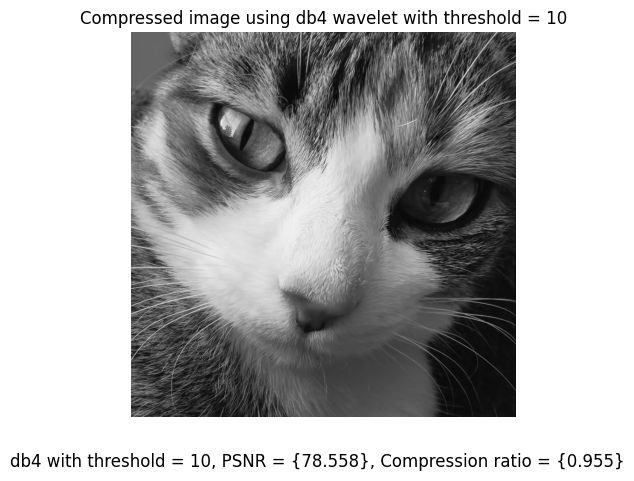

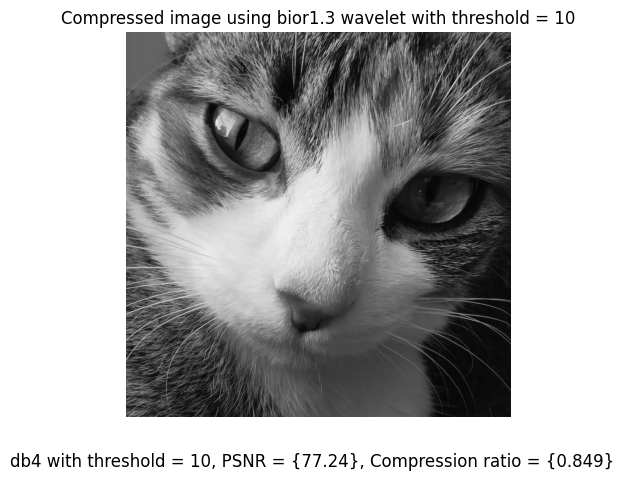

...

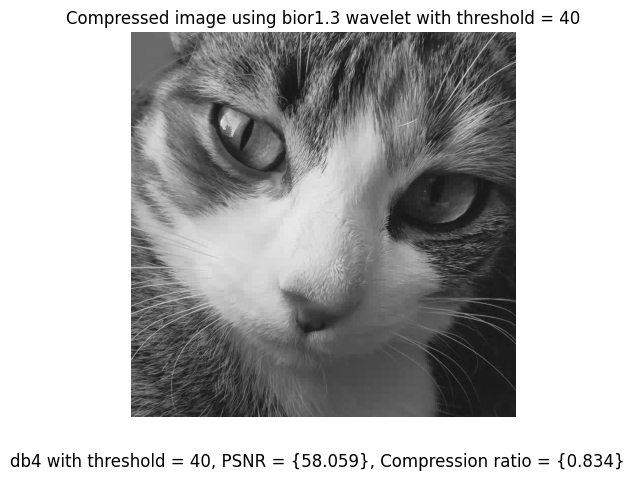

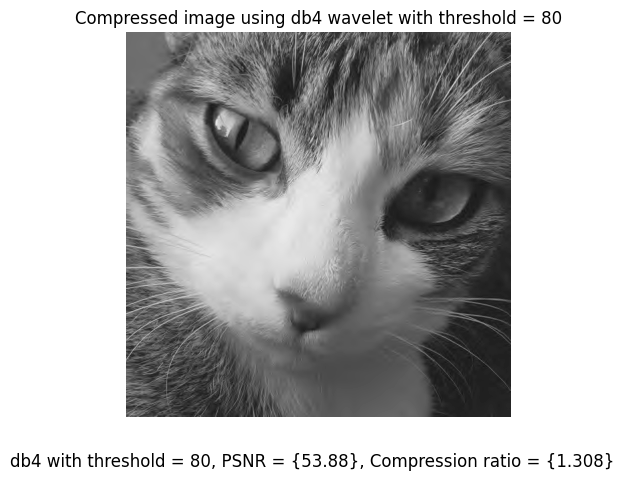

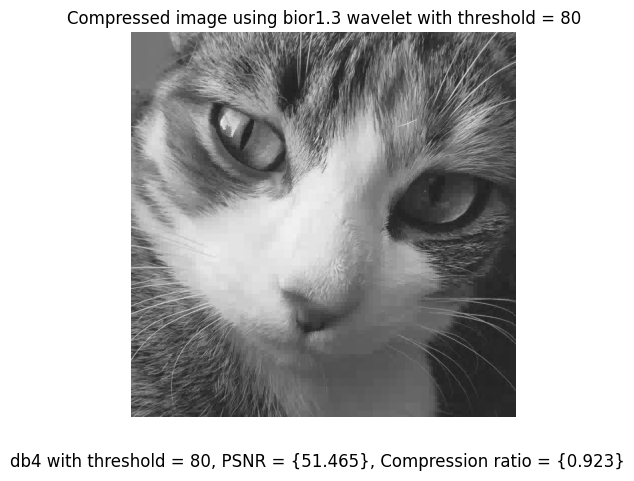

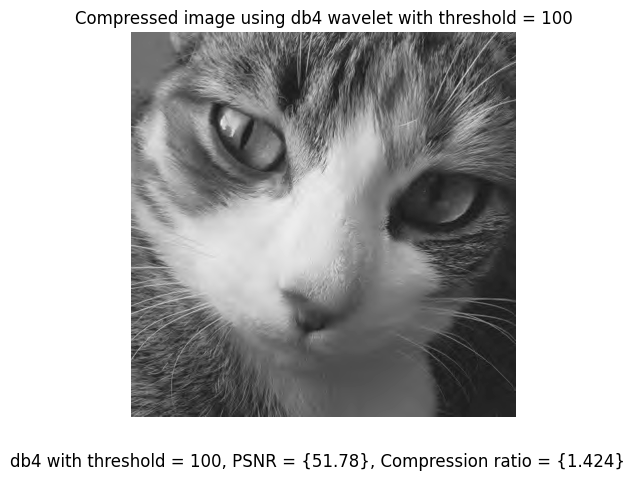

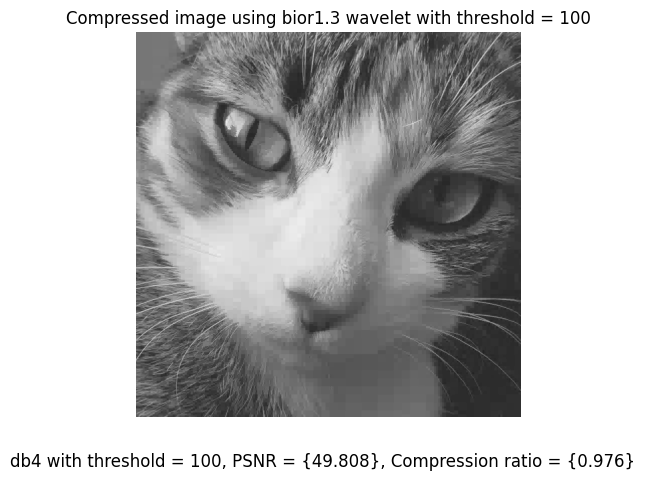

In [36]:
wavelet_1 = 'db4'
wavelet_2 = 'bior1.3'
thresholds = [5,10,20,40,80,100]
num_levels=6

# Wavelet scattering transform #

show_image(input_image, "Input image", fig_size = (5,5))

for threshold in thresholds :
    threshold_text = str(threshold)
    db4_image,db4_comp_ratio = codec(input_image,'db4',num_levels,threshold)
    db4_psnr = psnr(input_image,db4_image,warning = False)
    bior13_image,bior13_comp_ratio = codec(input_image,'bior1.3',num_levels,threshold)
    bior13_psnr = psnr(input_image,bior13_image,warning = False)
    text_db4 = "db4 with threshold = "+threshold_text+", PSNR = "+str({round(db4_psnr,3)})+", Compression ratio = "+str({round(db4_comp_ratio,3)})
    show_image(db4_image, "Compressed image using db4 wavelet with threshold = " + threshold_text, fig_size = (5,5), text = text_db4)
    text_bior13 = "db4 with threshold = "+threshold_text+", PSNR = "+str({round(bior13_psnr,3)})+", Compression ratio = "+str({round(bior13_comp_ratio,3)})
    show_image(bior13_image, "Compressed image using bior1.3 wavelet with threshold = " + threshold_text, fig_size = (5,5), text = text_bior13)

**QUESTIONS**

1) Which wavelet is better for the Trudy_for_compression.jpeg image and why?

## Answer and explanation ##

___

**Changes in PSNR function**

When doing this question, we had an issue with the shape of the images : the input image shape was different from the compressed image shape within the PSNR function :
ValueError: operands could not be broadcast together with shapes (1531,1532) (1532,1532)

We decided to tweak the function so that the shape would be the same to compute the PSNR, with a warning message that explains what was done if the dimensions were different.
You can change the warning = False to warning = True to see the new shape values, but for all the images it becomes (1531,1532)

**Changes in show_image function**

We also added in the show_image function the possibility to write some text below the image.

___

For the Trudy_for_compression.jpeg, we can see that : For every threshold, both the PSNR and compression ratio are **higher** for the Daubechies' db4 wavelet in comparaison with the bior1.3 wavelet. Looking at the images, we can see that db4 compression smoothen more the image while comparing to bior1.3

Overall, for **this image** we can say that db4 wavelet is more optimal. However it is good to remind that some wavelet are more suited for some images than others. It does not necessarily mean that db4 is more efficient than bior1.3 in general.
